# Machine Learning Hamrful Object Detection



- Group: C21-PR28
- Description:
  In this capstone project we planned on building object detection machine learning model. In this project we implements transfer learning from MobileNetV2 to be used for feature extractor for our object detection model

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
# !gdown 1nP_QIVfZ7k7NqZkGwRcV68xsK9Q02iME #hard_cases
!gdown 1upMO8DDYRZaQK74YvQf-KpFR4JP2k6wC #all

Downloading...
From (original): https://drive.google.com/uc?id=1upMO8DDYRZaQK74YvQf-KpFR4JP2k6wC
From (redirected): https://drive.google.com/uc?id=1upMO8DDYRZaQK74YvQf-KpFR4JP2k6wC&confirm=t&uuid=6521d322-9b02-4abf-9a01-4984d55c04e3
To: /content/all.zip
100% 601M/601M [00:19<00:00, 31.4MB/s]


In [ ]:
# !rm -rf /content/hard_case
# !unzip -q hard_case.zip -d /content/
!rm -rf /content/all
!unzip -q all.zip -d /content/

In [ ]:
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageOps
import numpy as np

In [ ]:
# # shared_folder = '/content/drive/MyDrive/LINKYI/hod_dataset_all/all'
# hard_case = '/content/hard_case/'
all = '/content/all/'

In [ ]:
os.chdir(all)

## Preprocessing and Data Visualization

### Helper Function

#### Resize Image

In [ ]:
# Target size 224, because most implementation of mobilenetv2 uses 224x224 input size
def pad_and_resize_image(image_path, target_size=(224, 224)):
    image = Image.open(image_path)
    if image.mode != 'RGB':
      #print(f"Not In RGB {image_path} is in {image.mode}")
      image = image.convert('RGB')
      #print(image_path)

    img_width, img_height = image.size

    # Determine the padding values to make the image square
    if img_width > img_height:
        delta_width = 0
        delta_height = img_width - img_height
    else:
        delta_width = img_height - img_width
        delta_height = 0

    padding = (delta_width // 2, delta_height // 2, delta_width - (delta_width // 2), delta_height - (delta_height // 2))

    # Add padding
    padded_image = ImageOps.expand(image, padding)
    # Resize to target size
    resized_image = padded_image.resize(target_size)

    return resized_image, img_width, img_height, padding

In [ ]:
class_map = {'alcohol': 0, 'insulting_gesture': 1, 'blood': 2, 'cigarette': 3, 'gun': 4, 'knife': 5}

# Encode Bounding Box Labels
def encode_labels(bboxes):
    for bbox in bboxes:
        bbox['class'] = class_map[bbox['class']]
    return bboxes

#### Parse txt and xml Label

In [ ]:
# Parse XML Label
def parse_xml(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    bboxes = []
    for obj in root.findall('object'):
        bbox = obj.find('bndbox')
        class_name = obj.find('name').text
        bboxes.append({
            'class': class_name,
            'xmin': int(bbox.find('xmin').text),
            'ymin': int(bbox.find('ymin').text),
            'xmax': int(bbox.find('xmax').text),
            'ymax': int(bbox.find('ymax').text)
        })
    return bboxes

In [ ]:
def parse_txt(file_path):
    bboxes = []
    with open(file_path, 'r') as file:
        for line in file.readlines():
            class_id, x_center, y_center, width, height = map(float, line.split())
            bboxes.append({
                'class': int(class_id),
                'x_center': x_center,
                'y_center': y_center,
                'width': width,
                'height': height
            })
    return bboxes

#### Visualization Helper

In [ ]:
# Function to normalize bounding boxes after resizing the image
def normalize_bbox(bbox, orig_width, orig_height, new_width, new_height, padding):
    pad_x, pad_y = padding[0], padding[1]
    scale_x, scale_y = new_width / (orig_width + padding[0] + padding[2]), new_height / (orig_height + padding[1] + padding[3])

    return {
        'class': bbox['class'],
        'xmin': int((bbox['xmin'] + pad_x) * scale_x),
        'ymin': int((bbox['ymin'] + pad_y) * scale_y),
        'xmax': int((bbox['xmax'] + pad_x) * scale_x),
        'ymax': int((bbox['ymax'] + pad_y) * scale_y)
    }

def normalize_bbox_2(bbox, orig_width, orig_height, new_width, new_height, padding):
    pad_x, pad_y = padding[0], padding[1]
    scale_x, scale_y = new_width / (orig_width + padding[0] + padding[2]), new_height / (orig_height + padding[1] + padding[3])

    return {
        'class': bbox['class'],
        'xmin': (bbox['xmin'] + pad_x) * scale_x / new_width,
        'ymin': (bbox['ymin'] + pad_y) * scale_y / new_height,
        'xmax': (bbox['xmax'] + pad_x) * scale_x / new_width,
        'ymax': (bbox['ymax'] + pad_y) * scale_y / new_height
    }

In [ ]:
#Function to visualize bounding boxes
def draw_bboxes(image_path, bboxes, target_size=(224, 224)):
    resized_image, orig_width, orig_height, padding = pad_and_resize_image(image_path, target_size)
    new_width, new_height = resized_image.size
    normalized_bboxes = [normalize_bbox(bbox, orig_width, orig_height, 224, 224, padding) for bbox in bboxes]

    plt.figure(figsize=(10, 10))
    plt.imshow(resized_image)
    ax = plt.gca()

    for bbox in normalized_bboxes:
        rect = patches.Rectangle((bbox['xmin'], bbox['ymin']),
                                 bbox['xmax'] - bbox['xmin'],
                                 bbox['ymax'] - bbox['ymin'],
                                 linewidth=1,
                                 edgecolor='r',
                                 facecolor='none')
        ax.add_patch(rect)
        plt.text(bbox['xmin'], bbox['ymin'] - 5, str(bbox['class']), color='red', fontsize=12)

    plt.show()

In [ ]:
# Function to convert TXT bounding boxes to absolute coordinates
def convert_to_absolute(bbox, img_width, img_height):
    x_center = bbox['x_center'] * img_width
    y_center = bbox['y_center'] * img_height
    width = bbox['width'] * img_width
    height = bbox['height'] * img_height

    xmin = int(x_center - width / 2)
    ymin = int(y_center - height / 2)
    xmax = int(x_center + width / 2)
    ymax = int(y_center + height / 2)

    return {'class': bbox['class'], 'xmin': xmin, 'ymin': ymin, 'xmax': xmax, 'ymax': ymax}


### Data Visualization

In [ ]:
# Path to the dataset
image_dir = 'jpg'
xml_dir = 'xml'
txt_dir = 'txt'

# Example usage
image_path = os.path.join(image_dir, 'img_hod_000005.jpg')
xml_path = os.path.join(xml_dir, 'img_hod_000005.xml')
txt_path = os.path.join(txt_dir, 'img_hod_000005.txt')

try:
    bboxes_xml = parse_xml(xml_path)
except FileNotFoundError:
    print(f"Error: {xml_path} not found. Skipping XML parsing.")
    bboxes_xml = []
# bboxes_txt = parse_txt(txt_path)
try:
    bboxes_txt = parse_txt(txt_path)
except FileNotFoundError:
    print(f"Error: {txt_path} not found. Skipping TXT parsing.")
    bboxes_txt = []

# Get the original image dimensions
print(image_path)
image, orig_width, orig_height, padding = pad_and_resize_image(image_path)

# Convert TXT bounding boxes to absolute coordinates
bboxes_txt_absolute = [convert_to_absolute(bbox, orig_width, orig_height) for bbox in bboxes_txt]


jpg/img_hod_000005.jpg


Bounding boxes from XML:


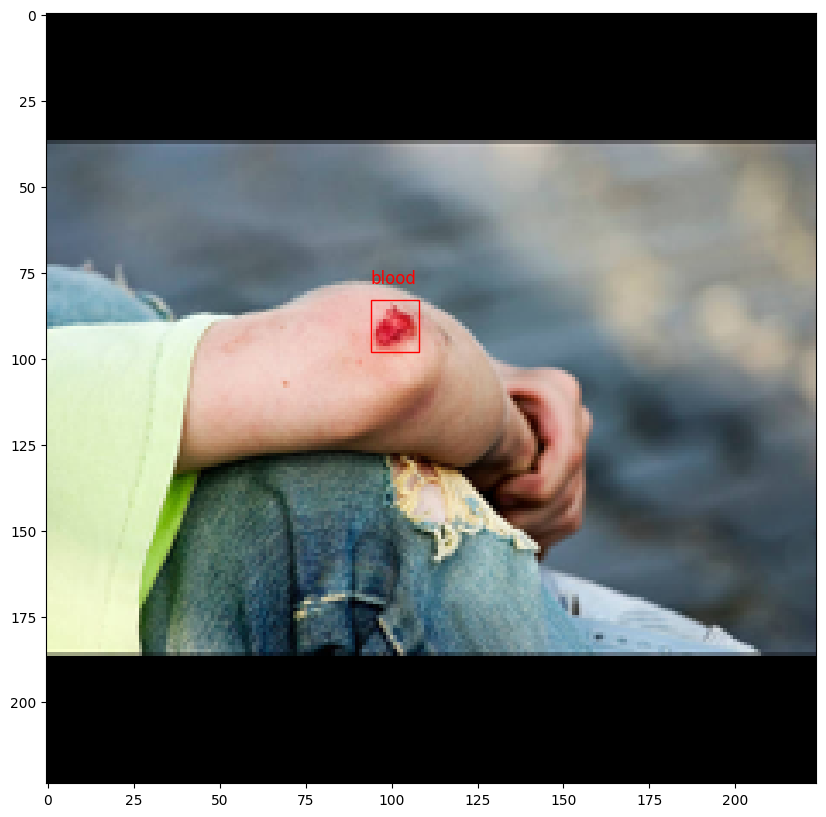

In [ ]:
# Visualize bounding boxes from XML
print("Bounding boxes from XML:")
draw_bboxes(image_path, bboxes_xml)

Bounding boxes from TXT:


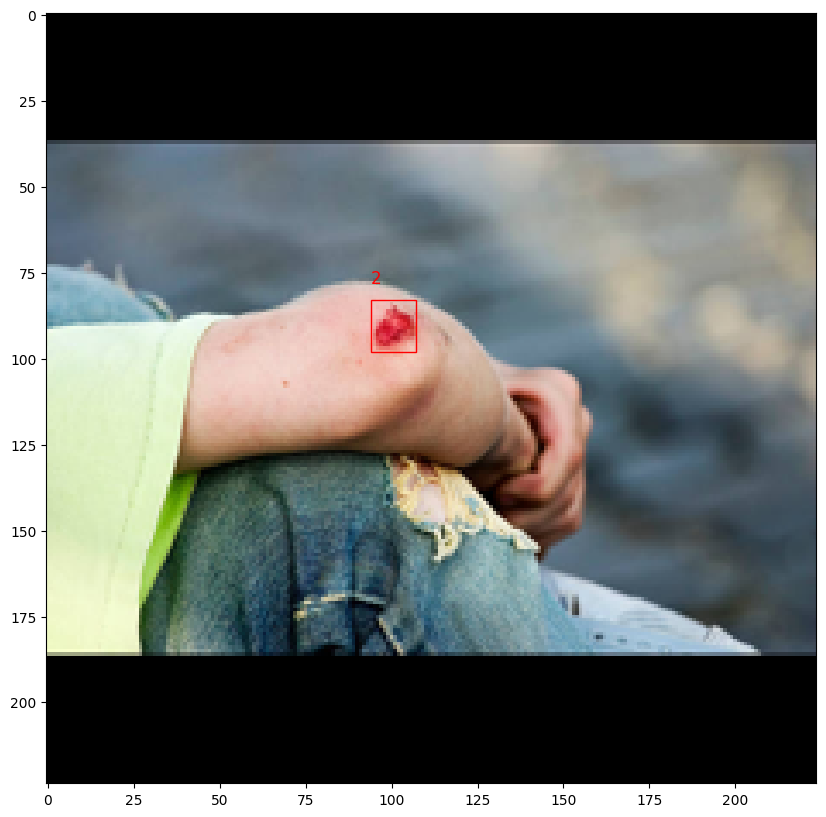

In [ ]:
# Visualize bounding boxes from TXT
print("Bounding boxes from TXT:")
draw_bboxes(image_path, bboxes_txt_absolute)

## Machine Learning Model

### Data Preprocessing

In [ ]:
from sklearn.model_selection import train_test_split
import os
import tensorflow as tf

#### Preprocessing Function

##### Used

In [ ]:
# For prediction only largest BBOX
def preprocess_image_and_bboxes(image_path, txt_path, target_size=(224, 224), num_classes=6):
    resized_image, orig_width, orig_height, padding = pad_and_resize_image(image_path, target_size)
    parsed_bboxes = parse_txt(txt_path)
    abs_bboxes = [convert_to_absolute(b, orig_width, orig_height) for b in parsed_bboxes]
    normalized_bboxes = [normalize_bbox_2(b, orig_width, orig_height, target_size[0], target_size[1], padding) for b in abs_bboxes]

    # Select the largest bounding box
    largest_bbox = max(normalized_bboxes, key=lambda b: (b['xmax'] - b['xmin']) * (b['ymax'] - b['ymin']), default=None)

    if largest_bbox:
        bbox_label = [largest_bbox['xmin'], largest_bbox['ymin'], largest_bbox['xmax'], largest_bbox['ymax']]
        class_label = [0] * num_classes
        class_label[largest_bbox['class']] = 1
    else:
        bbox_label = [0, 0, 0, 0]  # Default to zeros if no bbox is found
        class_label = [1] + [0] * (num_classes - 1)  # Default to background class if no bbox is found

    return np.array(resized_image) / 255.0, np.array(bbox_label), np.array(class_label)

##### Load Dataset

In [ ]:
# ONLY 1 BBOX
def load_and_preprocess_data(image_dir, txt_dir, target_size=(224, 224), num_classes=6):
    image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir)]
    txt_paths = [os.path.join(txt_dir, fname.replace('.jpg', '.txt')) for fname in os.listdir(image_dir)]

    def generator():
        for img_path, txt_path in zip(image_paths, txt_paths):
            try:
                img, bbox, class_label = preprocess_image_and_bboxes(img_path, txt_path, target_size, num_classes)
                if img is None:
                    raise ValueError(f"Image at {img_path} was processed as None")
                if img.ndim == 2 or img.shape[-1] == 1:
                    img = np.stack((img,) * 3, axis=-1)
                elif img.shape[-1] == 2:
                    img = np.concatenate((img, np.zeros((img.shape[0], img.shape[1], 1))), axis=-1)

                # confidence = np.array([1.0])

                #print(bbox)
                yield img, {"bounding_box": bbox, "class_label": class_label}
            except Exception as e:
                print(f"Error processing {img_path}: {e}")
                continue

    return tf.data.Dataset.from_generator(generator, output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        {
            "bounding_box": tf.TensorSpec(shape=(4,), dtype=tf.float32),
            "class_label": tf.TensorSpec(shape=(num_classes,), dtype=tf.float32),
            #"confidence": tf.TensorSpec(shape=(1,), dtype=tf.float32),
        }
    ))


### Load Dataset

In [ ]:
image_dir = 'jpg'
txt_dir = 'txt'
dataset = load_and_preprocess_data(image_dir, txt_dir)


In [ ]:
dataset_len = 10631
train_size = int(0.8 * dataset_len)
val_size = int(0.1 * dataset_len)
test_size = dataset_len - train_size - val_size


print(f"Train Size: {train_size}")
print(f"Validation Size: {val_size}")
print(f"Test Size: {test_size}")

Train Size: 8504
Validation Size: 1063
Test Size: 1064


In [ ]:
train_dataset = dataset.take(train_size)
val_dataset = dataset.skip(train_size).take(val_size)
test_dataset = dataset.skip(train_size + val_size)

In [ ]:
train_dataset = train_dataset.batch(32).prefetch(tf.data.experimental.AUTOTUNE)
val_dataset = val_dataset.batch(32).prefetch(tf.data.experimental.AUTOTUNE)
test_dataset = test_dataset.batch(32).prefetch(tf.data.experimental.AUTOTUNE)

### Visualize preprocessed data

In [ ]:
def visualize_sample_train(image, bbox, class_label, class_names):
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    # Draw prediction bounding box
    xmin, ymin, xmax, ymax = bbox
    width, height = xmax - xmin, ymax - ymin
    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='g', facecolor='none')
    ax.add_patch(rect)

    # Display class label
    class_idx = class_label.argmax()
    plt.text(10, 10, class_names[class_idx], color='green', bbox=dict(facecolor='white', alpha=0.5))

    plt.show()

In [ ]:
def visualize_predictions_train(dataset, class_names):
    for image_batch, label_batch in dataset.take(1):
        for i in range(len(image_batch)):
            image = image_batch[i]
            bbox_true = label_batch['bounding_box'][i]
            class_true = label_batch['class_label'][i].numpy()

            # Scale the predicted bounding box back to the original image size
            bbox_true = bbox_true.numpy() * 224

            visualize_sample_train(image.numpy(), bbox_true, class_true, class_names)

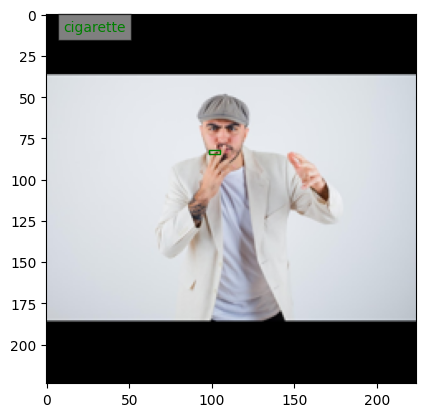

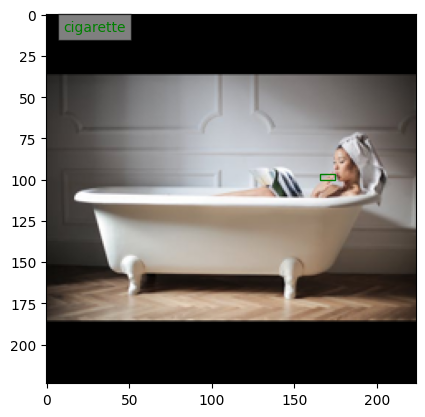

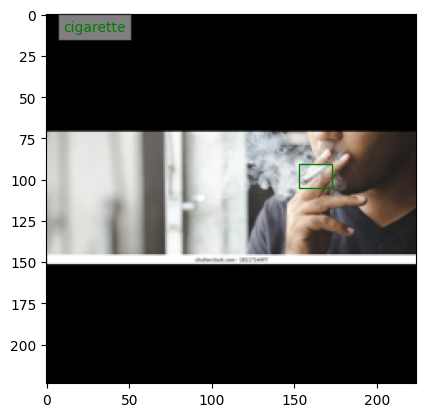

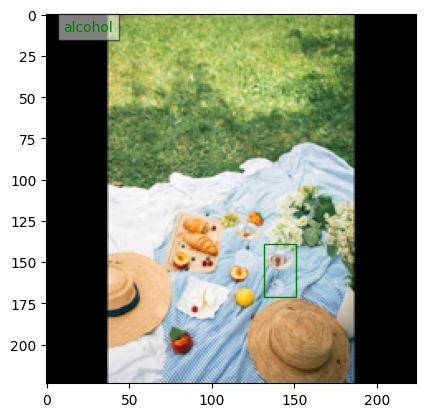

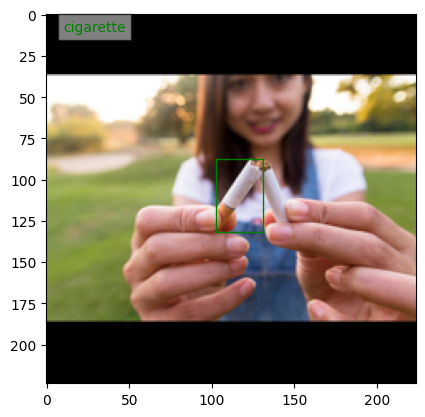

...

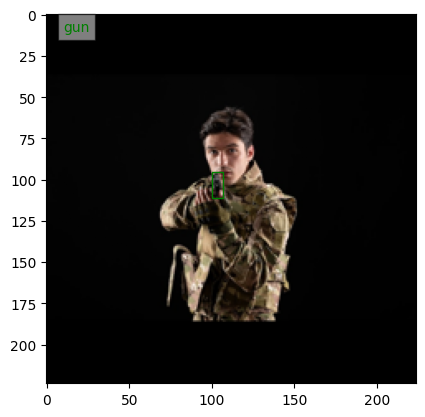

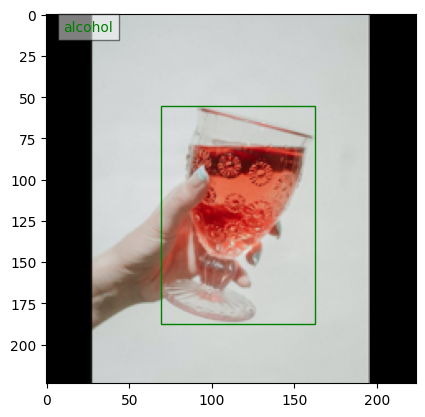

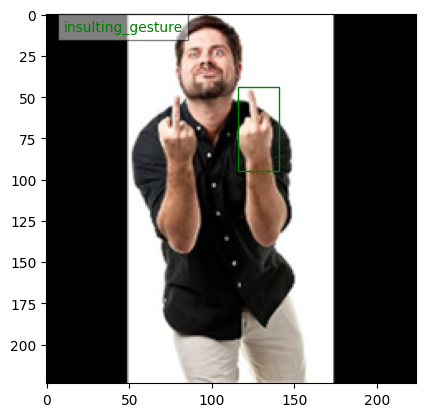

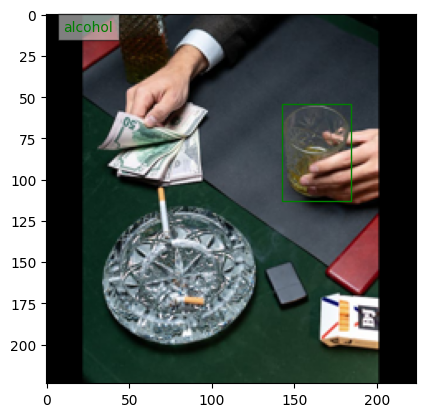

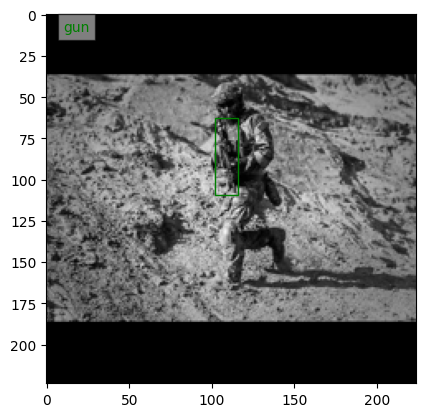

In [ ]:
# Dataset Visualization
class_names = ['alcohol', 'insulting_gesture', 'blood', 'cigarette', 'gun', 'knife']

visualize_predictions_train(train_dataset, class_names)

### Define The Model

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Reshape, Concatenate, Dropout
from tensorflow.keras.models import Model

In [ ]:
# Define Base Model
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Define Custom Layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.2)(x)

num_classes = 6
max_boxes = 1
# max_boxes = 5
# Define Bounding Box Output Layer
bbox_output = Dense(256, activation='relu')(x)
bbox_output = Dense(128, activation='relu')(bbox_output)
bbox_output = Dense(max_boxes*4, activation='sigmoid', name='bounding_box')(bbox_output)

# Define Class Output Layer
class_output = Dense(256, activation='relu')(x)
class_output = Dense(128, activation='relu')(class_output)
class_output = Dropout(0.2)(class_output)
class_output = Dense(max_boxes*num_classes, activation='softmax', name='class_label')(class_output)

# # Confidence score
# confidence_output = Dense(64, activation='relu')(x)
# confidence_output = Dense(1, activation='sigmoid', name='confidence')(confidence_output)


# Define model
model = Model(inputs=base_model.input, outputs=(bbox_output, class_output))

9406464/9406464 [==============================] - 0s 0us/step


In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_1[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']        

In [ ]:
# Freeze Layer in Base Model
for layer in base_model.layers:
    layer.trainable = False

### Train the Model

In [ ]:
losses = {
	"class_label": "categorical_crossentropy",
	"bounding_box": "mean_squared_error",
}

lossWeights = {
	"class_label": 0.5,
	"bounding_box": 1.0,
}

model.compile(optimizer=tf.keras.optimizers.Adam(), loss=losses, metrics={'class_label': 'accuracy'}, loss_weights=lossWeights)

In [ ]:
history = model.fit(train_dataset, epochs=20, validation_data=val_dataset)


Epoch 1/20
266/266 [==============================] - 236s 848ms/step - loss: 0.4367 - bounding_box_loss: 0.0280 - class_label_loss: 0.8174 - class_label_accuracy: 0.7034 - val_loss: 0.3804 - val_bounding_box_loss: 0.0264 - val_class_label_loss: 0.7081 - val_class_label_accuracy: 0.7545
Epoch 2/20
266/266 [==============================] - 252s 948ms/step - loss: 0.3072 - bounding_box_loss: 0.0251 - class_label_loss: 0.5643 - class_label_accuracy: 0.8059 - val_loss: 0.3810 - val_bounding_box_loss: 0.0257 - val_class_label_loss: 0.7107 - val_class_label_accuracy: 0.7545
Epoch 3/20
266/266 [==============================] - 221s 832ms/step - loss: 0.2578 - bounding_box_loss: 0.0244 - class_label_loss: 0.4669 - class_label_accuracy: 0.8369 - val_loss: 0.3616 - val_bounding_box_loss: 0.0252 - val_class_label_loss: 0.6726 - val_class_label_accuracy: 0.7817
Epoch 4/20
266/266 [==============================] - 219s 825ms/step - loss: 0.2241 - bounding_box_loss: 0.0238 - class_label_loss: 0.4

In [ ]:
model.save('mobilenetv2_finetuned_hod.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
history.history

{'loss': [0.4366914927959442,
  0.30724653601646423,
  0.2578465938568115,
  0.22413642704486847,
  0.1843205988407135,
  0.16852490603923798,
  0.15076056122779846,
  0.1350182294845581,
  0.12081599235534668,
  0.10873745381832123,
  0.09788434207439423,
  0.08764822036027908,
  0.07919400185346603,
  0.0780894085764885,
  0.07359722256660461,
  0.07116760313510895,
  0.06594318151473999,
  0.06330188363790512,
  0.060057468712329865,
  0.05664593726396561],
 'bounding_box_loss': [0.02800055593252182,
  0.025110645219683647,
  0.024417228996753693,
  0.02382514998316765,
  0.023407166823744774,
  0.023120999336242676,
  0.022816652432084084,
  0.022457202896475792,
  0.022199777886271477,
  0.02192537859082222,
  0.02168479934334755,
  0.02155095525085926,
  0.02118750289082527,
  0.02094907872378826,
  0.020958762615919113,
  0.02062005177140236,
  0.020303847268223763,
  0.02002134919166565,
  0.019737426191568375,
  0.019707443192601204],
 'class_label_loss': [0.8173819780349731,


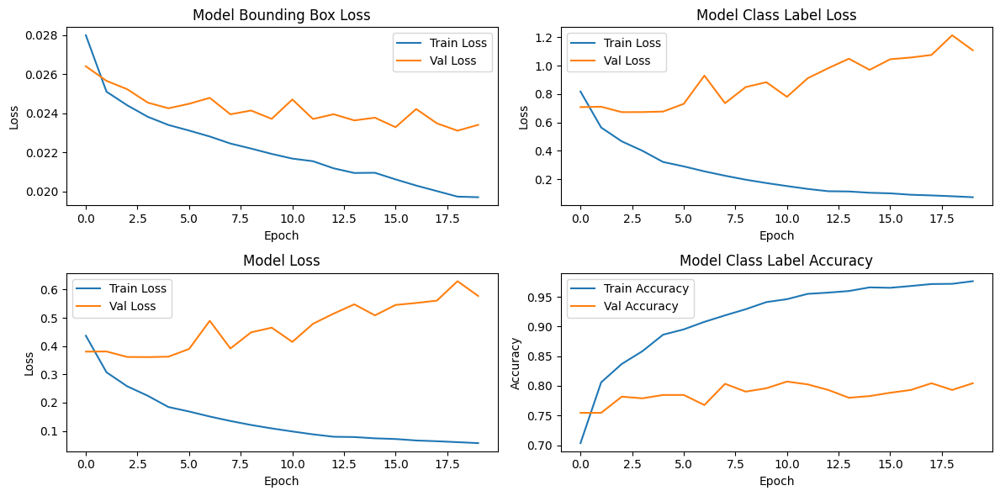

In [ ]:
plt.figure(figsize=(12, 6))
plt.subplot(2, 2, 1)
plt.plot(history.history['bounding_box_loss'], label='Train Loss')
plt.plot(history.history['val_bounding_box_loss'], label='Val Loss')
plt.title('Model Bounding Box Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(history.history['class_label_loss'], label='Train Loss')
plt.plot(history.history['val_class_label_loss'], label='Val Loss')
plt.title('Model Class Label Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(history.history['class_label_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_class_label_accuracy'], label='Val Accuracy')
plt.title('Model Class Label Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

### Evaluate Model

##### Evaluate on Test Dataset

In [ ]:
evaluation = model.evaluate(test_dataset)
print(f'Test Total Loss: {evaluation[0]}')
print(f'Test Bounding Box Loss: {evaluation[1]}')
print(f'Test Class Label Loss: {evaluation[2]}')
print(f'Test Class Label Accuracy: {evaluation[3]}')

34/34 [==============================] - 128s 501ms/step - loss: 0.5458 - bounding_box_loss: 0.0227 - class_label_loss: 1.0463 - class_label_accuracy: 0.8158
Test Total Loss: 0.5458422303199768
Test Bounding Box Loss: 0.02270316332578659
Test Class Label Loss: 1.0462782382965088
Test Class Label Accuracy: 0.8157894611358643


##### Visualize Prediction

In [ ]:
os.chdir(all)

img_path_predict = 'img_hod_000926.jpg'
img_bbox_true = 'img_hod_000926.txt'

image_path_predict = os.path.join(image_dir, img_path_predict)
txt_path_predict = os.path.join(txt_dir, img_bbox_true)
txt_bbox_true = parse_txt(txt_path_predict)
#print(image_path_predict)
image, orig_width, orig_height, padding = pad_and_resize_image(image_path_predict)

bboxes_txt_absolute_true = [convert_to_absolute(bbox, orig_width, orig_height) for bbox in txt_bbox_true]
# Normalize and reshape the image
image = np.array(image) / 255.0
image = np.expand_dims(image, axis=0)  # Add batch dimension

print(orig_width, orig_height, padding, image.shape)

prediction = model.predict(image)
print(prediction)

501 612 (55, 0, 56, 0) (1, 224, 224, 3)
1/1 [==============================] - 1s 1s/step
(array([[0.31148598, 0.34227297, 0.67484486, 0.6918077 ]], dtype=float32), array([[6.2772891e-35, 6.6902278e-34, 1.0000000e+00, 5.9753637e-27,
        4.3808267e-38, 1.4671304e-30]], dtype=float32))


In [ ]:
print(bboxes_txt_absolute_true)
print(prediction[0][0]*224)

[{'class': 2, 'xmin': 127, 'ymin': 126, 'xmax': 275, 'ymax': 471}]
[ 69.77286  76.66914 151.16525 154.96492]


In [ ]:
print(prediction[1])

[[6.2772891e-35 6.6902278e-34 1.0000000e+00 5.9753637e-27 4.3808267e-38
  1.4671304e-30]]


[ 69.77286  76.66914 151.16525 154.96492]


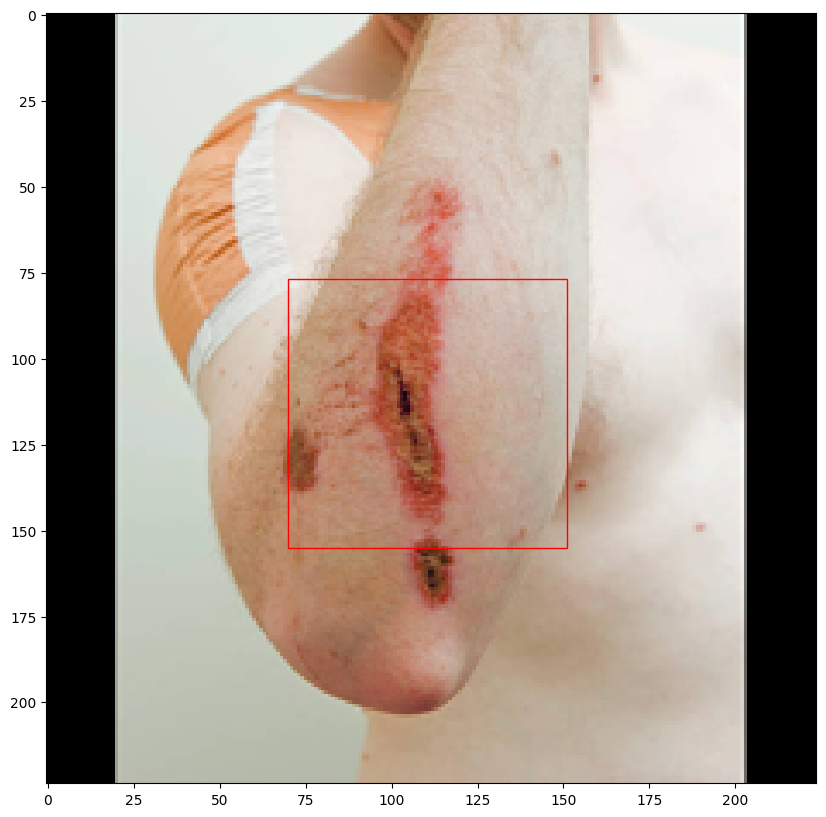

In [ ]:
# Draw Prediction
bbox_pred = prediction[0][0] * 224
print(bbox_pred)

plt.figure(figsize=(10, 10))
image_pred, orig_width, orig_height, padding = pad_and_resize_image(image_path_predict)

plt.imshow(image_pred)
ax = plt.gca()


rect = patches.Rectangle((bbox_pred[0], bbox_pred[1]),
                         bbox_pred[2] - bbox_pred[0],
                         bbox_pred[3] - bbox_pred[1],
                         linewidth=1,
                         edgecolor='r',
                         facecolor='none')
ax.add_patch(rect)
plt.show()

In [ ]:
def visualize_sample(image, bbox_pred, bbox_true, class_label, class_true, class_names):
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    # Draw predicted bounding box
    xmin_pred, ymin_pred, xmax_pred, ymax_pred = bbox_pred
    width_pred, height_pred = xmax_pred - xmin_pred, ymax_pred - ymin_pred
    rect_pred = patches.Rectangle((xmin_pred, ymin_pred), width_pred, height_pred, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect_pred)

    # Draw true bounding box
    xmin_true, ymin_true, xmax_true, ymax_true = bbox_true
    width_true, height_true = xmax_true - xmin_true, ymax_true - ymin_true
    rect_true = patches.Rectangle((xmin_true, ymin_true), width_true, height_true, linewidth=1, edgecolor='g', facecolor='none')
    ax.add_patch(rect_true)

    # Display class label prediction
    class_idx = class_label.argmax()
    plt.text(xmin_pred, ymin_pred - 10, f'{class_names[class_idx]}_pred', color='red', bbox=dict(facecolor='white', alpha=0.5))

    # # Display class label for true box
    class_true_idx = class_true.argmax()
    plt.text(xmin_true, ymin_true - 10, f'{class_names[class_true_idx]}_true', color='green', bbox=dict(facecolor='white', alpha=0.5))

    plt.show()


In [ ]:
def visualize_predictions(model, dataset, class_names):
    for image_batch, label_batch in dataset.take(1):
        for i in range(len(image_batch)):
            image = image_batch[i]
            bbox_true = label_batch['bounding_box'][i]
            #print(bbox_true)
            class_true = label_batch['class_label'][i]

            # Preprocess the input image tensor
            #print(image.shape)
            input_tensor = tf.expand_dims(image, axis=0)
            #print(input_tensor.shape)

            bbox_pred, class_pred = model.predict(input_tensor)
            #print(bbox_pred, class_pred)

            # Scale the predicted bounding box back to the original image size
            bbox_pred = bbox_pred[0] * 224
            bbox_true = bbox_true.numpy() * 224

            visualize_sample(image.numpy(), bbox_pred, bbox_true, class_pred[0], class_true.numpy(), class_names)

1/1 [==============================] - 0s 35ms/step


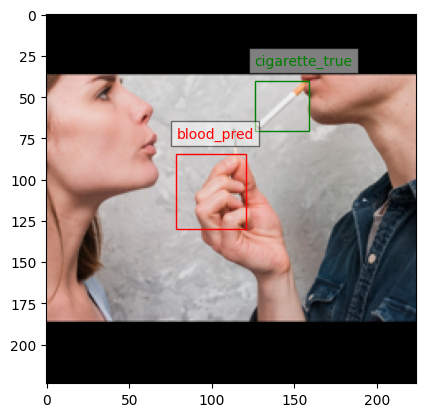

1/1 [==============================] - 0s 39ms/step


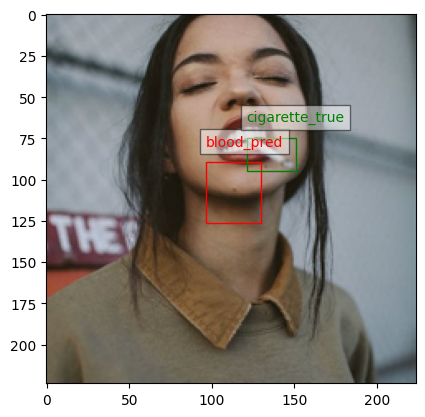

1/1 [==============================] - 0s 26ms/step


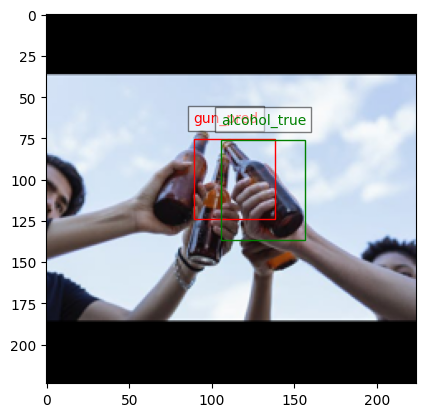

1/1 [==============================] - 0s 22ms/step


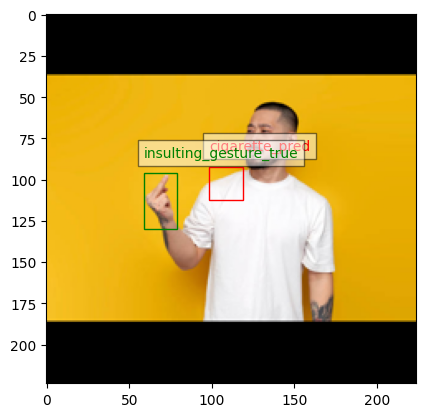

1/1 [==============================] - 0s 30ms/step


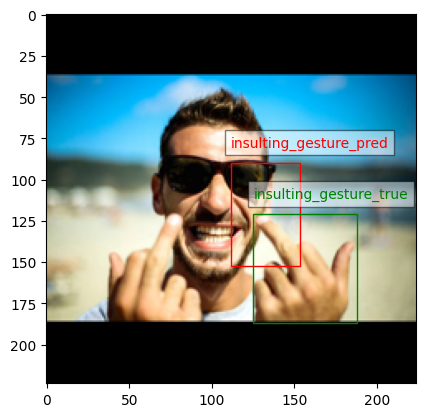

1/1 [==============================] - 0s 23ms/step


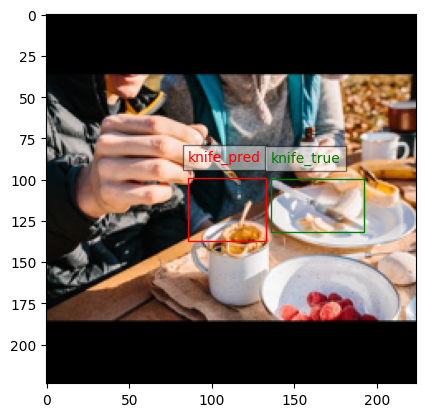

1/1 [==============================] - 0s 28ms/step


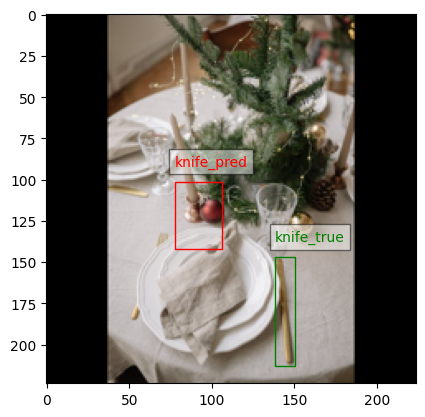

1/1 [==============================] - 0s 46ms/step


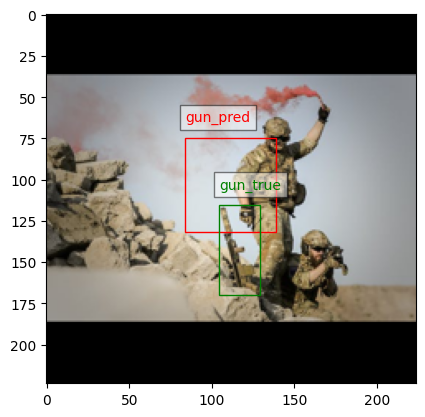

1/1 [==============================] - 0s 26ms/step


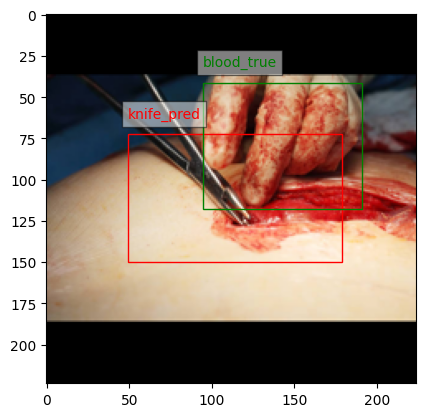

1/1 [==============================] - 0s 27ms/step


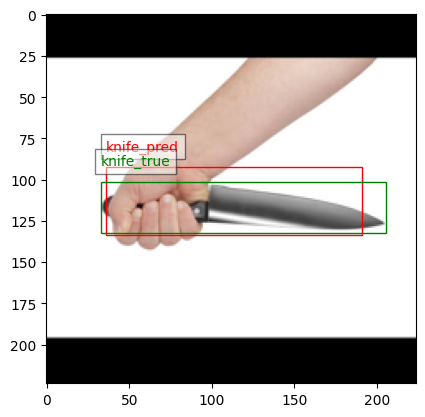

1/1 [==============================] - 0s 21ms/step


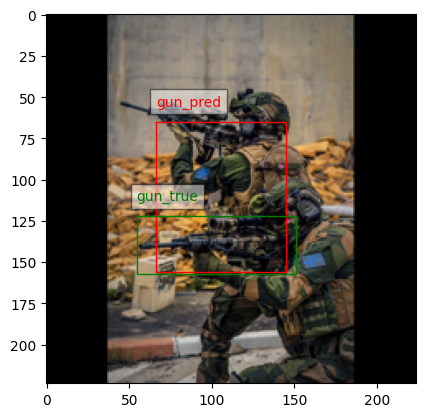

1/1 [==============================] - 0s 30ms/step


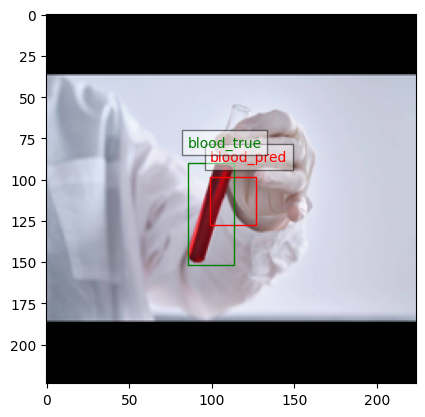

1/1 [==============================] - 0s 33ms/step


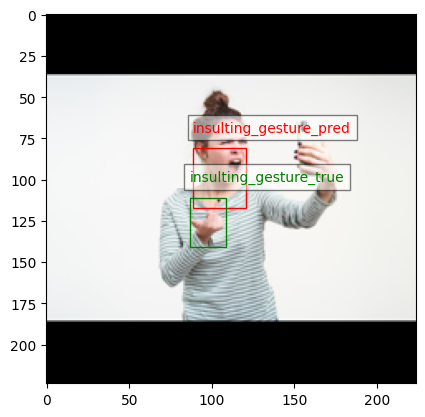

1/1 [==============================] - 0s 24ms/step


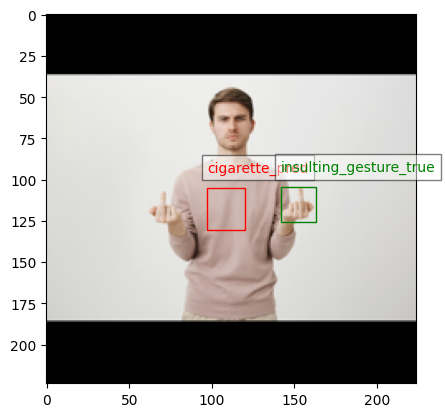

1/1 [==============================] - 0s 24ms/step


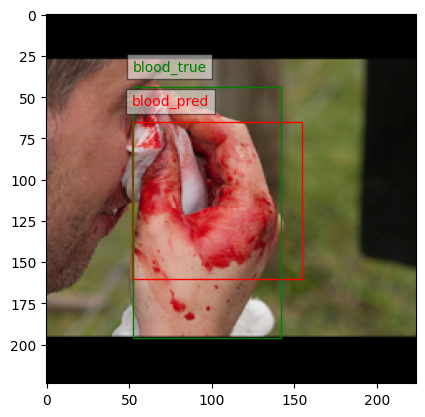

1/1 [==============================] - 0s 32ms/step


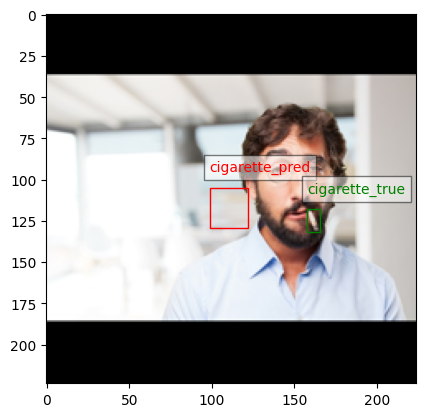

1/1 [==============================] - 0s 28ms/step


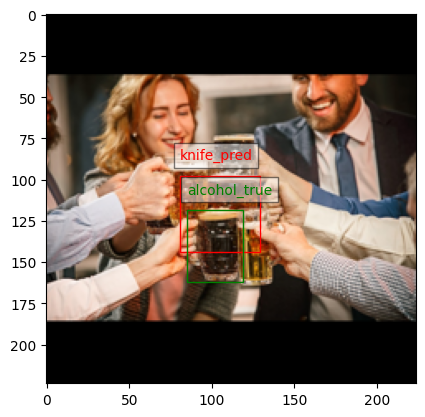

1/1 [==============================] - 0s 31ms/step


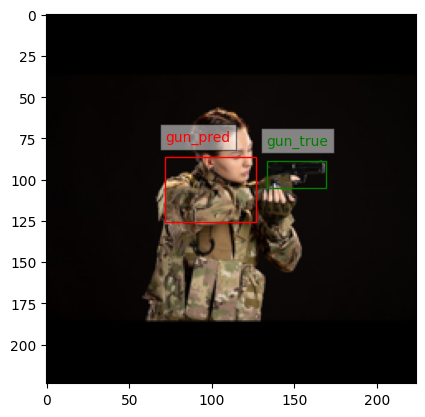

1/1 [==============================] - 0s 31ms/step


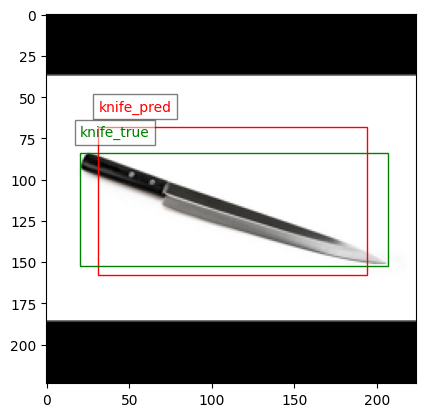

1/1 [==============================] - 0s 21ms/step


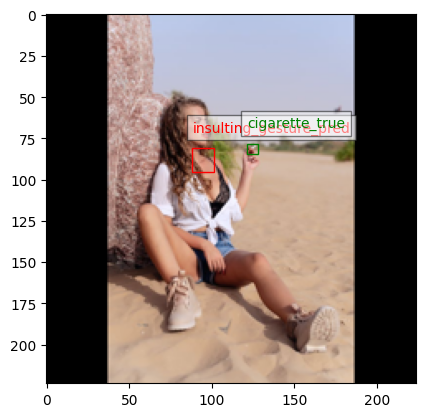

1/1 [==============================] - 0s 30ms/step


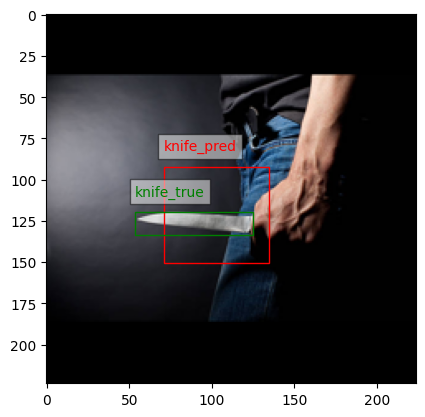

1/1 [==============================] - 0s 25ms/step


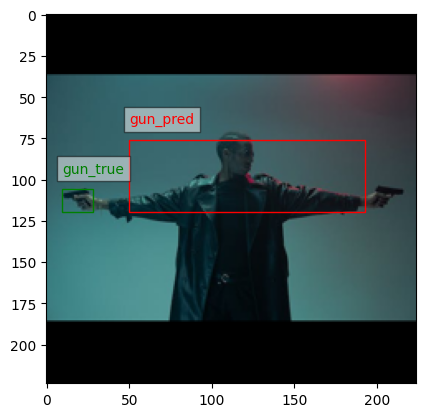

1/1 [==============================] - 0s 44ms/step


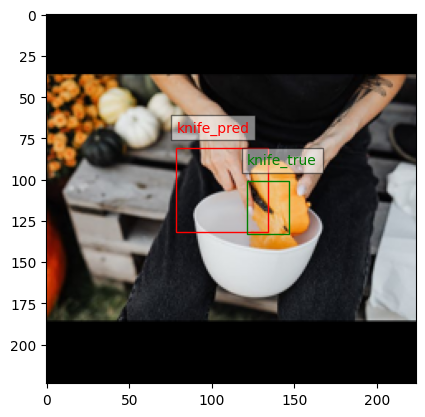

1/1 [==============================] - 0s 40ms/step


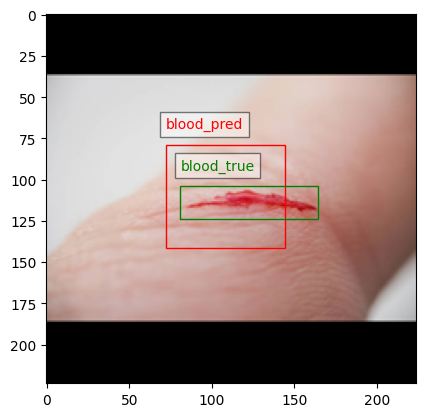

1/1 [==============================] - 0s 35ms/step


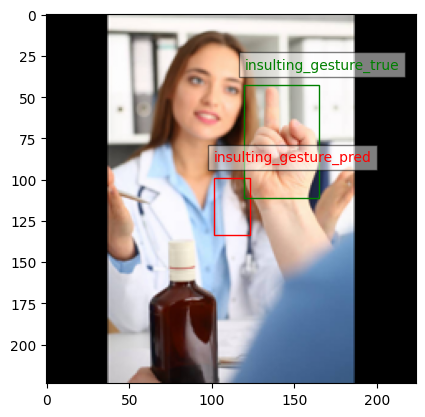

1/1 [==============================] - 0s 31ms/step


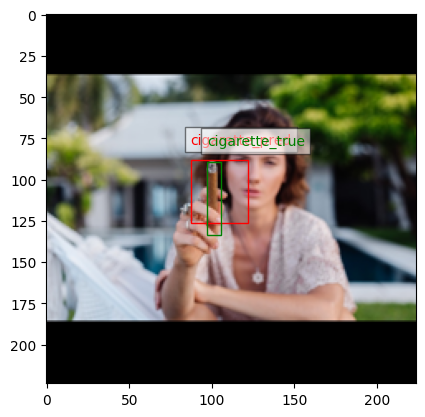

1/1 [==============================] - 0s 31ms/step


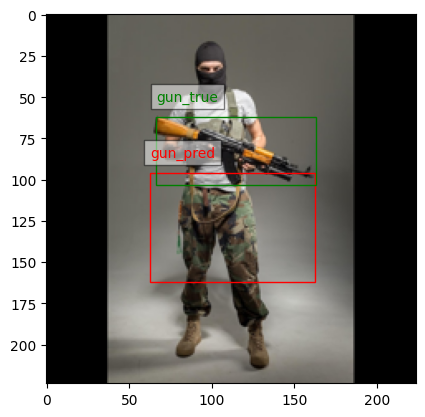

1/1 [==============================] - 0s 48ms/step


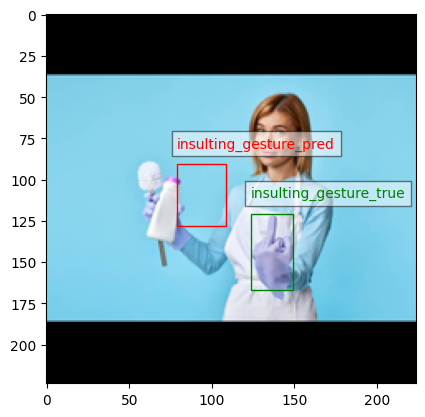

1/1 [==============================] - 0s 42ms/step


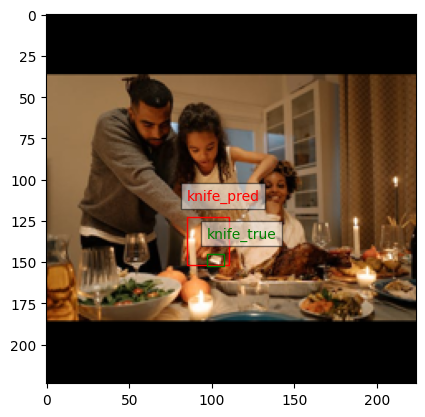

1/1 [==============================] - 0s 34ms/step


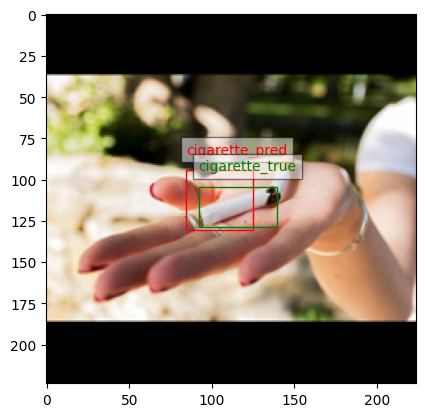

1/1 [==============================] - 0s 41ms/step


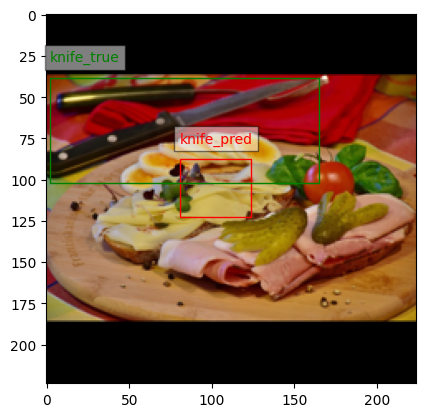

1/1 [==============================] - 0s 33ms/step


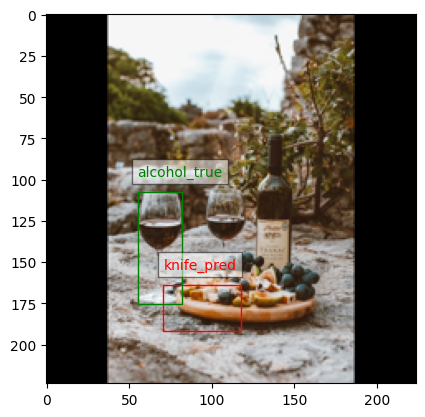

In [ ]:
# Test Dataset Visualization
class_names = ['alcohol', 'insulting_gesture', 'blood', 'cigarette', 'gun', 'knife']

visualize_predictions(model, test_dataset, class_names)

1/1 [==============================] - 0s 36ms/step


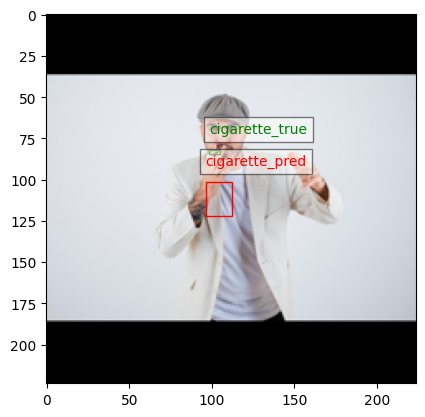

1/1 [==============================] - 0s 34ms/step


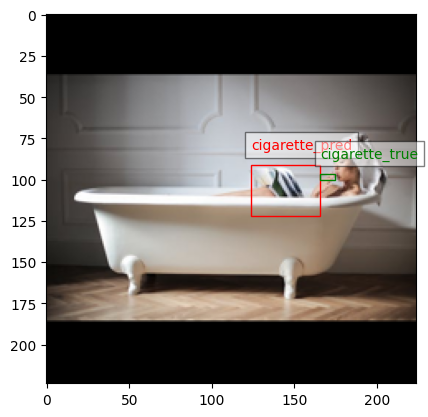

1/1 [==============================] - 0s 22ms/step


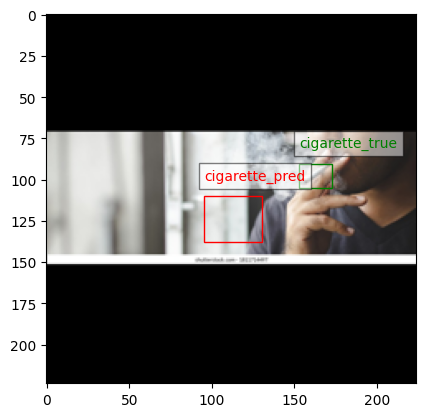

1/1 [==============================] - 0s 22ms/step


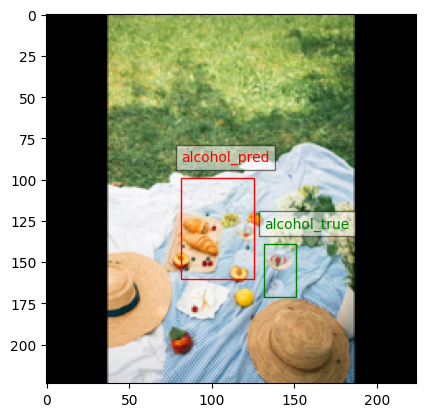

1/1 [==============================] - 0s 36ms/step


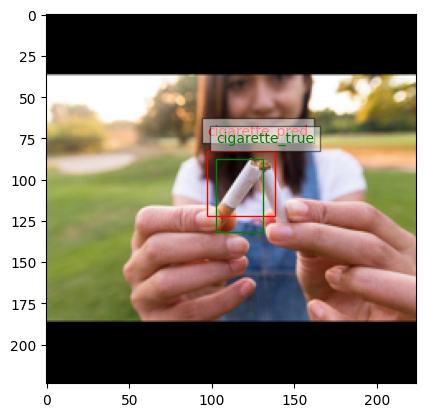

1/1 [==============================] - 0s 24ms/step


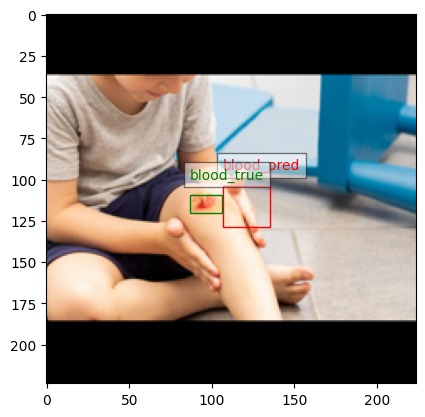

1/1 [==============================] - 0s 22ms/step


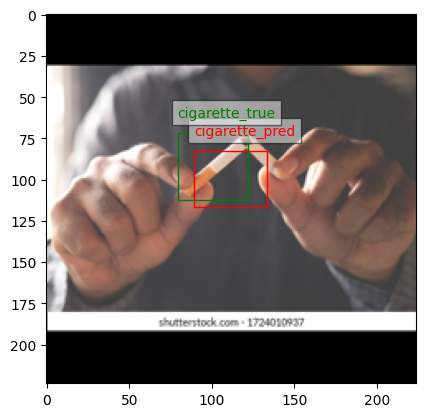

1/1 [==============================] - 0s 21ms/step


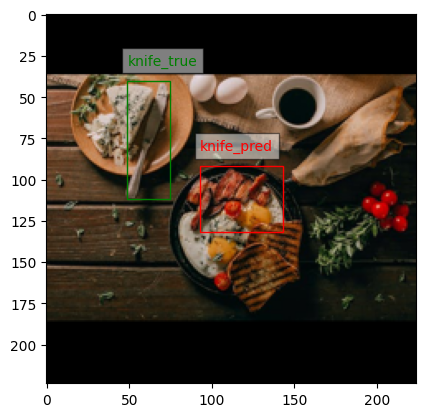

1/1 [==============================] - 0s 29ms/step


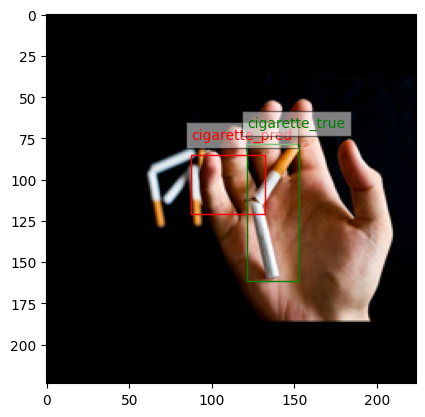

1/1 [==============================] - 0s 33ms/step


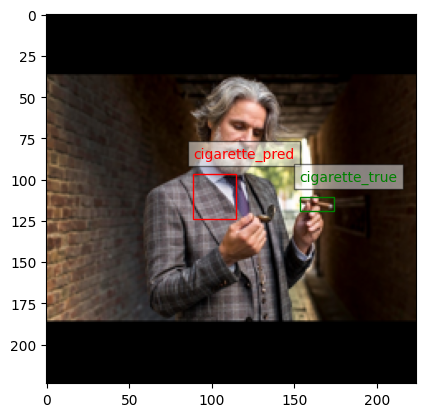

1/1 [==============================] - 0s 34ms/step


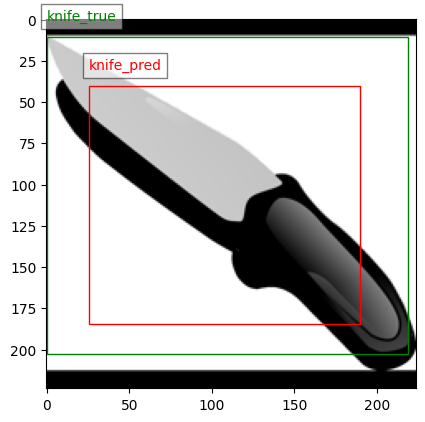

1/1 [==============================] - 0s 31ms/step


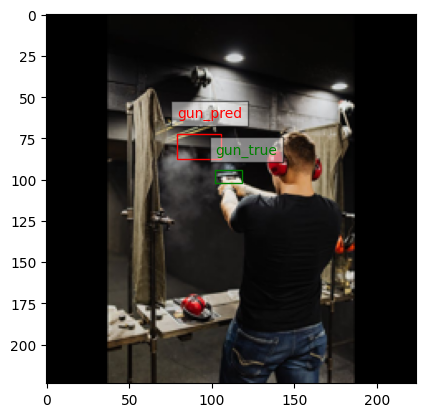

1/1 [==============================] - 0s 31ms/step


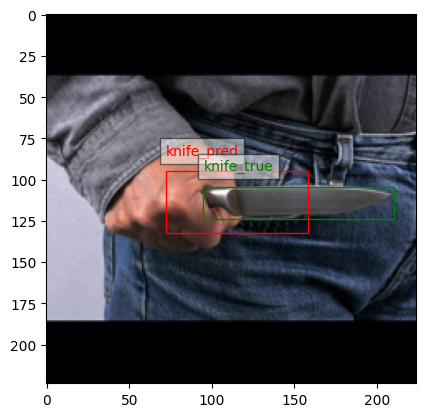

1/1 [==============================] - 0s 38ms/step


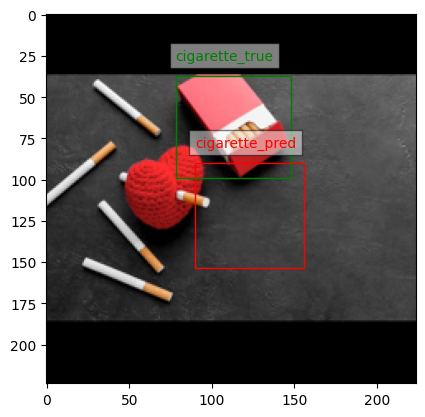

1/1 [==============================] - 0s 45ms/step


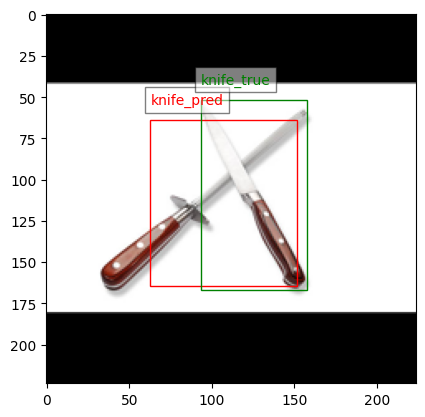

1/1 [==============================] - 0s 43ms/step


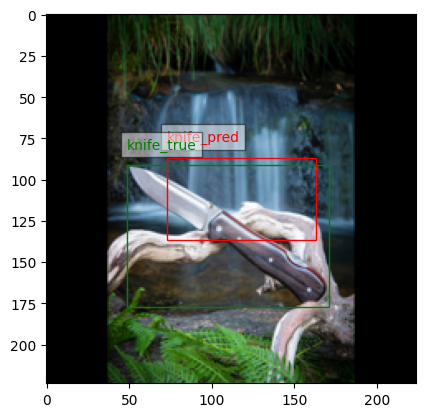

1/1 [==============================] - 0s 42ms/step


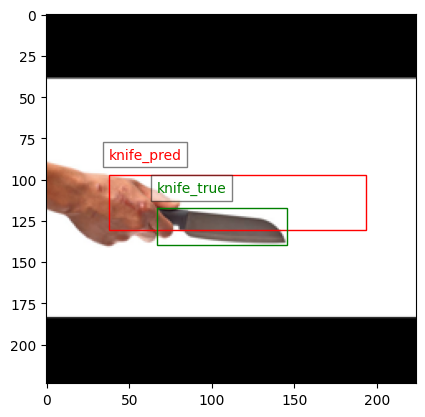

1/1 [==============================] - 0s 42ms/step


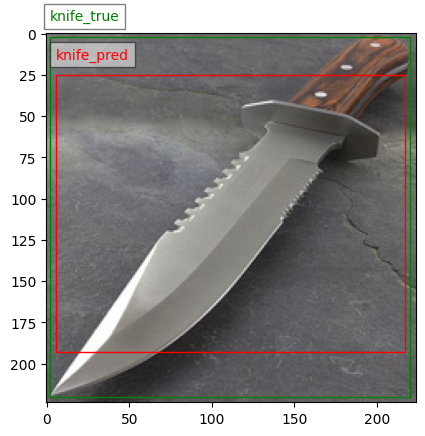

1/1 [==============================] - 0s 31ms/step


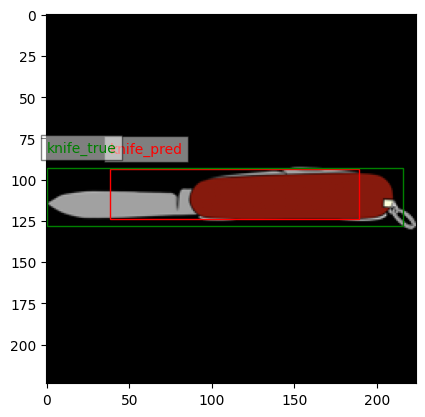

1/1 [==============================] - 0s 21ms/step


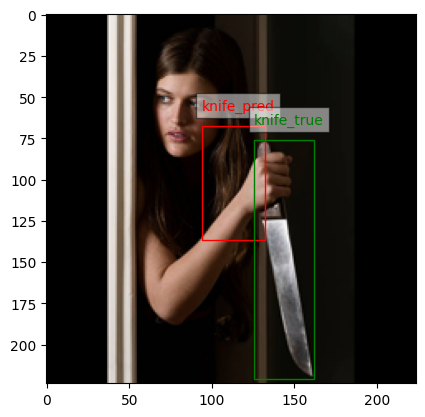

1/1 [==============================] - 0s 28ms/step


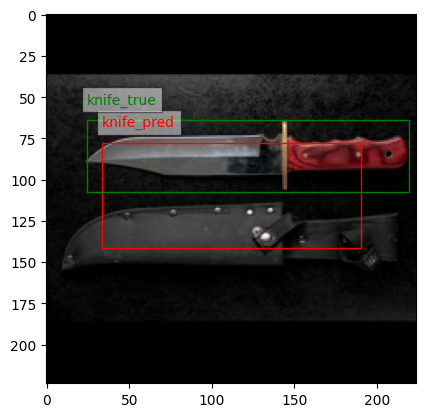

1/1 [==============================] - 0s 30ms/step


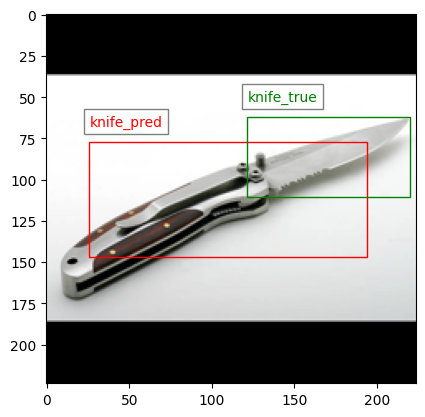

1/1 [==============================] - 0s 29ms/step


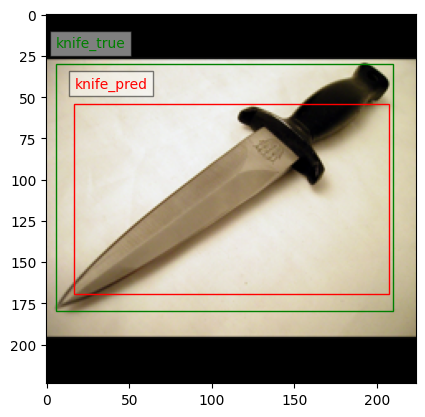

1/1 [==============================] - 0s 33ms/step


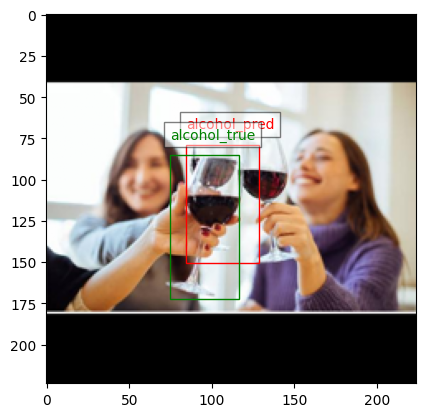

1/1 [==============================] - 0s 30ms/step


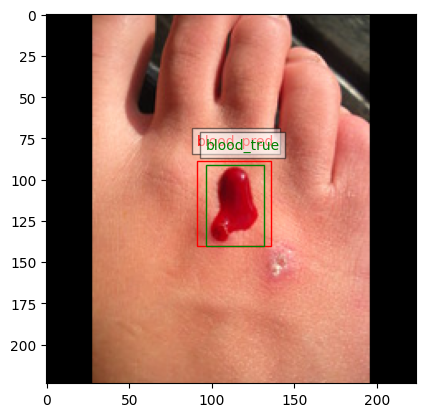

1/1 [==============================] - 0s 31ms/step


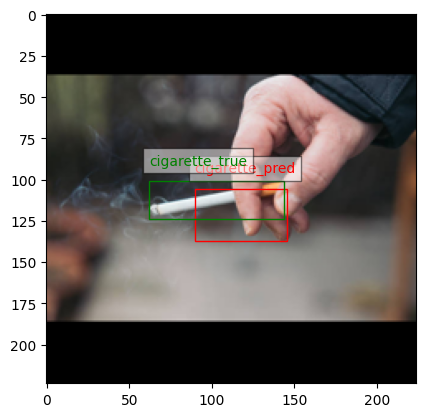

1/1 [==============================] - 0s 50ms/step


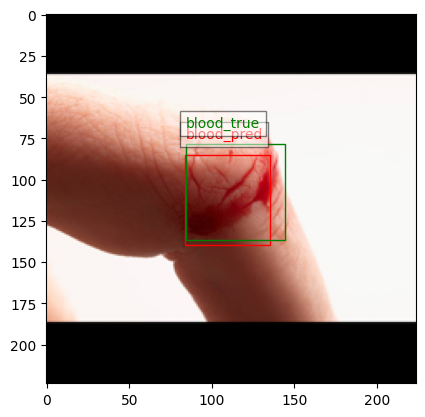

1/1 [==============================] - 0s 26ms/step


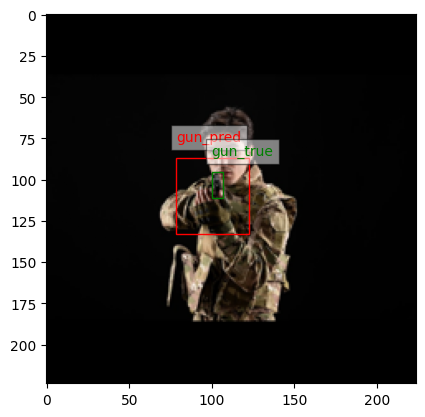

1/1 [==============================] - 0s 27ms/step


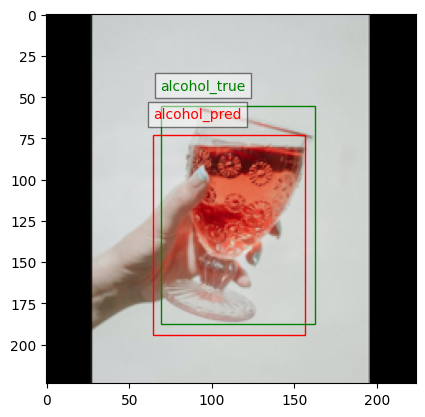

1/1 [==============================] - 0s 31ms/step


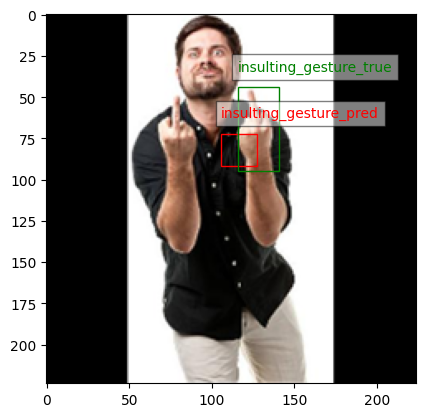

1/1 [==============================] - 0s 34ms/step


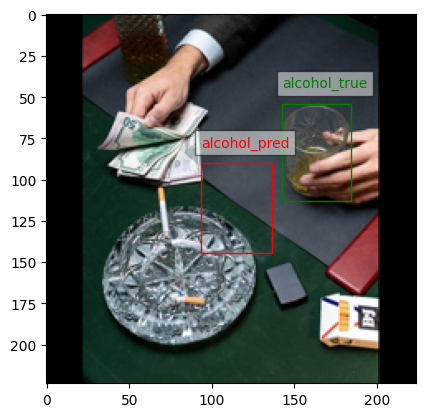

1/1 [==============================] - 0s 40ms/step


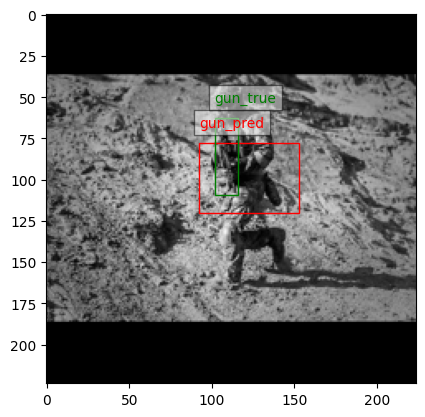

In [ ]:
# Train dataset visualization
visualize_predictions(model, train_dataset, class_names)

### Save Model

In [ ]:
model.save('mobilenetv2_finetuned_hod.h5')

### Convert Model to TfLite

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open('mobilenetv2_finetuned_hod.tflite', 'wb') as f:
    f.write(tflite_model)